In [1]:
import pandas as pd
pd.set_option('mode.chained_assignment', None)
pd.set_option('display.max_rows', 100)

import os

import numpy as np
import matplotlib.pyplot as plt

In [2]:
calves = pd.read_csv('sample cleaned/breedings.csv', )
calves.calving_date = pd.to_datetime(calves.calving_date, errors='coerce')
calves

,cow_id,lactation_number,event,calving_date
0,1,3,BRED,2018-06-04
1,1,4,BRED,2019-06-09
2,2,2,BRED,2018-06-04
3,4,2,BRED,2018-07-08
4,6,1,BRED,2017-10-20
...,...,...,...,...
2677,13528,0,BRED,2018-11-25
2678,13536,0,BRED,2018-11-26
2679,13537,0,BRED,2018-11-27
2680,13560,0,BRED,2018-12-05


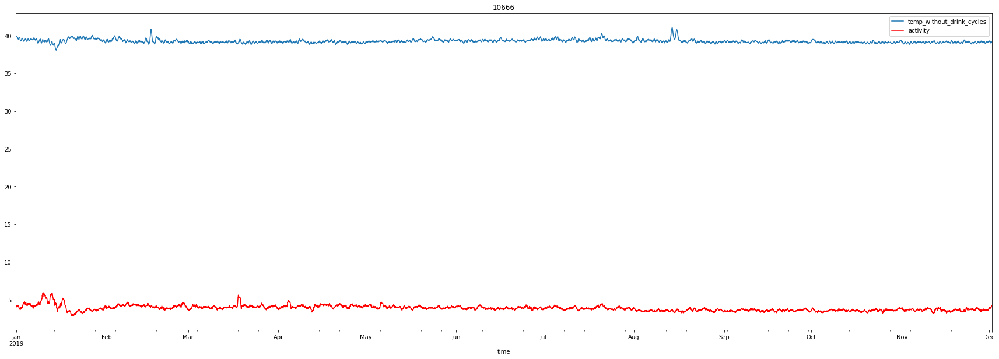

2018-09-11 00:00:00


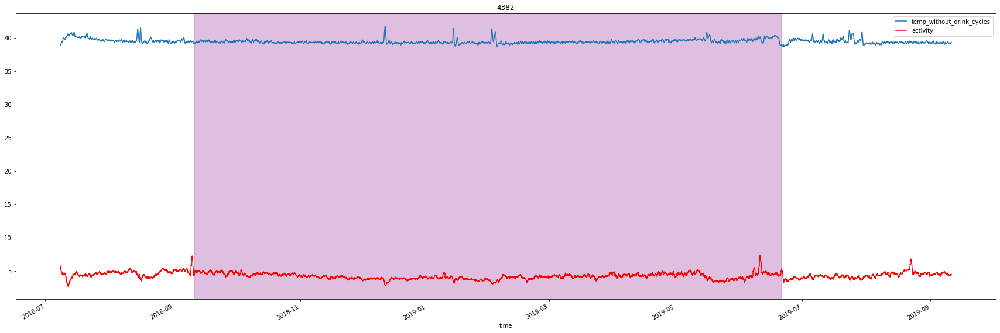

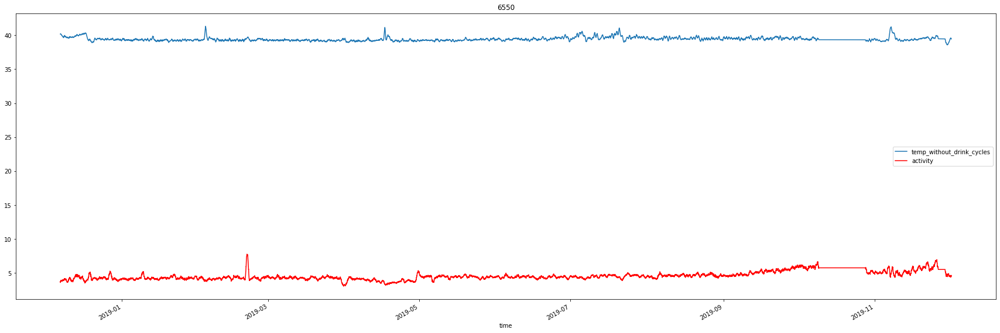

2017-12-03 00:00:00
2018-11-26 00:00:00


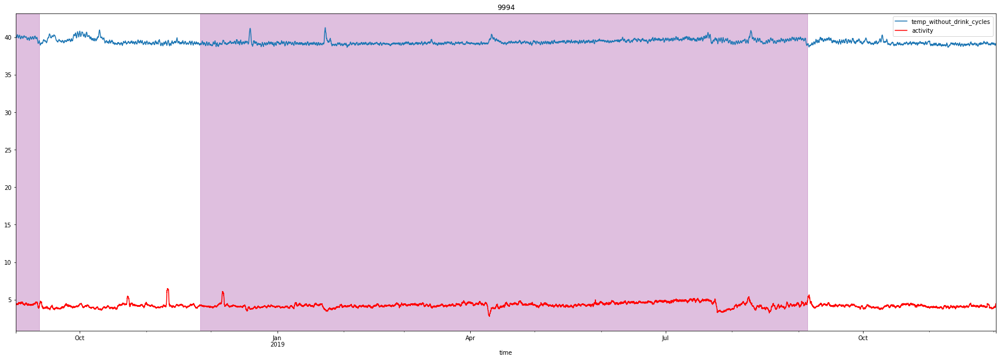

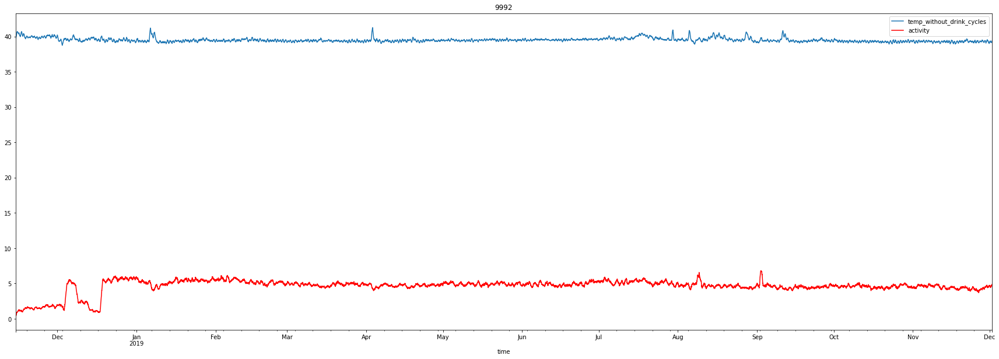

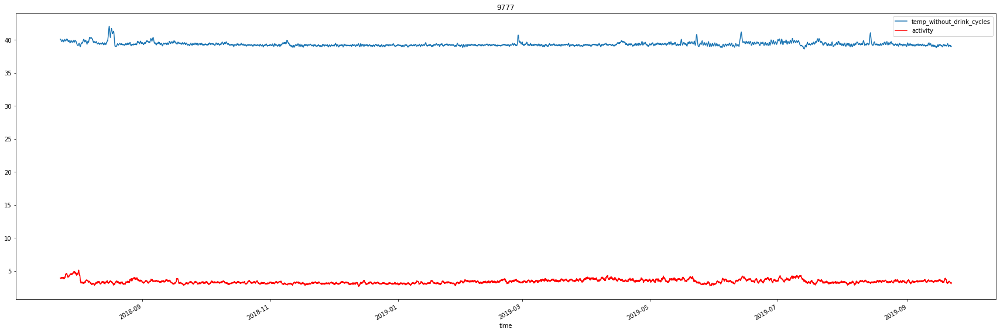

2018-10-28 00:00:00


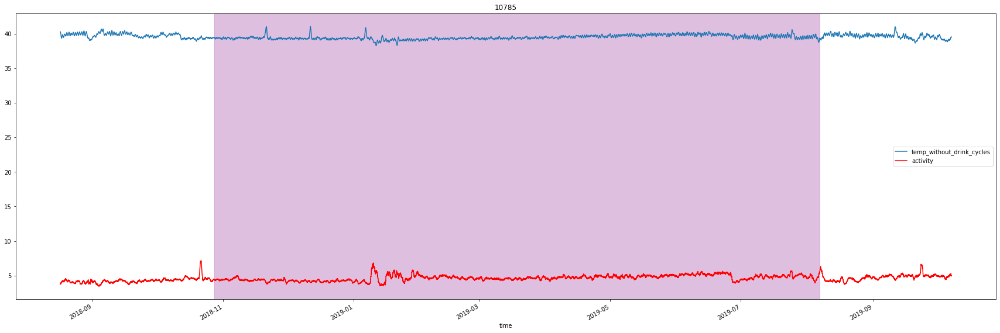

2018-03-20 00:00:00


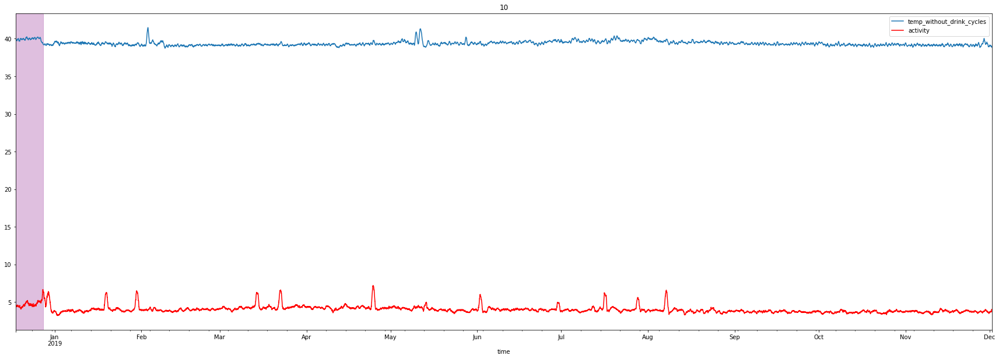

2018-03-15 00:00:00


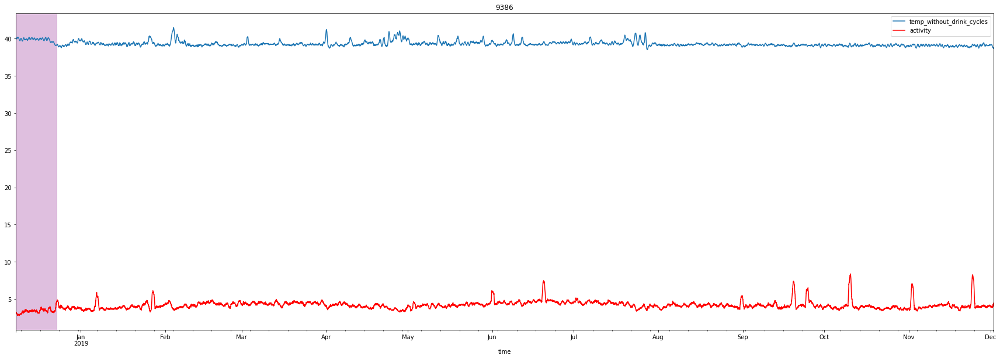

2018-09-27 00:00:00


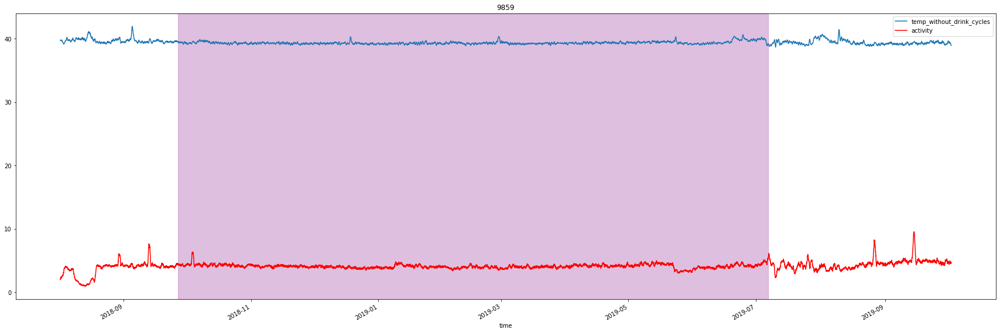

In [42]:
cows = dict()
for file_name in os.listdir('sample cleaned2/'):
    if file_name != 'breedings.csv' and file_name.split('.')[1] == 'csv':
        df = pd.read_csv('sample cleaned2/' + file_name, parse_dates=['time'])
        
        cow_id = int(file_name.split('.')[0])
        plot_cow(df, cow_id)
        
        # standardizing
        df.temp_without_drink_cycles = (df.temp_without_drink_cycles - df.temp_without_drink_cycles.mean()) / df.temp_without_drink_cycles.std()
        df.activity = (df.activity - df.activity.mean()) / df.activity.std()
        
        cows[cow_id] = df

In [4]:
DAY = 24*6

# HEAT_MIN = 8*6
# HEAT_MAX = 30*6

CYCLE_MIN = 21
CYCLE_MAX = 26

# relevant_cols = ['act_heat_index_smart', 'activity', 'activity_1day_avg', '60percentile_of_5day_temp', 
#                  'temp_height_index', 'temp_inc_index', 'temp_without_drink_cycles']
relevant_cols = ['activity', 'temp_without_drink_cycles']

In [46]:
def plot_cow(df, cow_id, heat=None, lines=None):
    ax = plt.gca()
    ax.set_title(cow_id)

    min_date = min(df.time)
    max_date = max(df.time)
    df.plot(kind='line', x='time', y='temp_without_drink_cycles', ax=ax, figsize=(30, 10))
    df.plot(kind='line', x='time', y='activity', color='red', ax=ax)

    for date in calves[calves.cow_id == cow_id].calving_date:
        pregnancy = (date - pd.Timedelta(days=283), date)
        if pregnancy[1] > min_date and pregnancy[0] < (max_date + pd.Timedelta(days=30)):
            print(pregnancy[0])
            ax.axvspan(pregnancy[0], pregnancy[1], color='purple', alpha=0.25)
    
    if heat is not None:
        gap, heats = heat
        print(gap)
        for x in heats:
            print(x)
            ax.axvline(x, color='green')
            ax.axvline(x + pd.Timedelta(days=1), color='green')
 
    if lines is not None:
        for x in lines:
            ax.axvline(x, color='pink')

    plt.show()

In [47]:
from scipy.signal import find_peaks
import numpy as np

def get_maxes(df):
    a_peaks, a_props = find_peaks(df.activity.values, prominence=(None, None), wlen=DAY)
    t_peaks, t_props = find_peaks(df.temp_without_drink_cycles.values, prominence=(None, None), wlen=DAY)
    maxes = pd.DataFrame({
        'a': pd.Series(data=a_props['prominences'], index=a_peaks), 
        't': pd.Series(data=t_props['prominences'], index=t_peaks)
    }).sum(axis=1).reindex(range(len(df)), fill_value=0)
    maxes = pd.DataFrame({'maxes': maxes, 'time': df.time})
    maxes = maxes.groupby(maxes.time.dt.date).max().drop('time', axis=1)[1:].reset_index()
    return maxes


def get_heats(df, cow_id):
    maxes = get_maxes(df)

    starts = dict()
    cycle_length = CYCLE_MIN
    for c in range(CYCLE_MIN, CYCLE_MAX):
        maxes['cycle_start'] = np.arange(len(maxes)) % c
        maxes['weight'] = (maxes.index // c) / 10 + 10
        temp = maxes.groupby(by='cycle_start').apply(lambda x: sum(x.maxes * x.weight) / len(x))
        start_date = df.time[df.time.dt.date == maxes.time[maxes.cycle_start == temp.argmax()].iloc[0]].iloc[0]
        starts[c] = (start_date, temp.max())

    gap, (start, _) = max(starts.items(), key=lambda x: x[1][1])
    return gap, pd.date_range(start, df.time.iloc[-1] - pd.Timedelta(days=1), freq=pd.Timedelta(days=gap)).values

In [27]:
df = cows[cow]

z = get_heats(df, cow)

In [37]:
str(np.datetime64(z[1][-1], 'D'))

'2019-08-16'

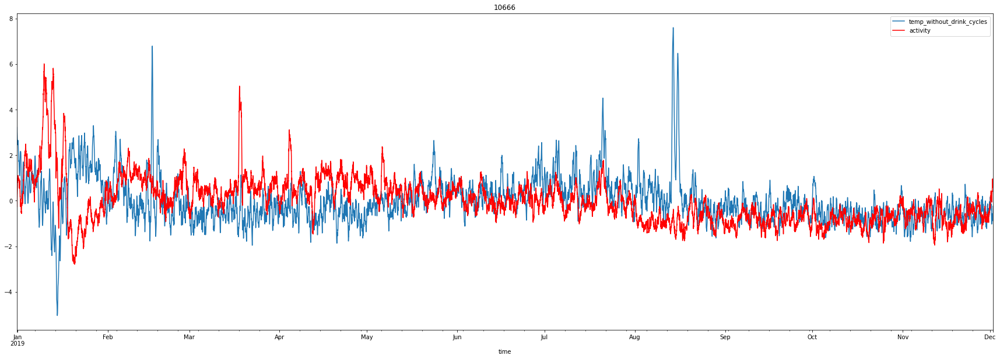

24
2019-01-10T00:09:00.000000000
2019-02-03T00:09:00.000000000
2019-02-27T00:09:00.000000000
2019-03-23T00:09:00.000000000
2019-04-16T00:09:00.000000000
2019-05-10T00:09:00.000000000
2019-06-03T00:09:00.000000000
2019-06-27T00:09:00.000000000
2019-07-21T00:09:00.000000000
2019-08-14T00:09:00.000000000
2019-09-07T00:09:00.000000000
2019-10-01T00:09:00.000000000
2019-10-25T00:09:00.000000000
2019-11-18T00:09:00.000000000


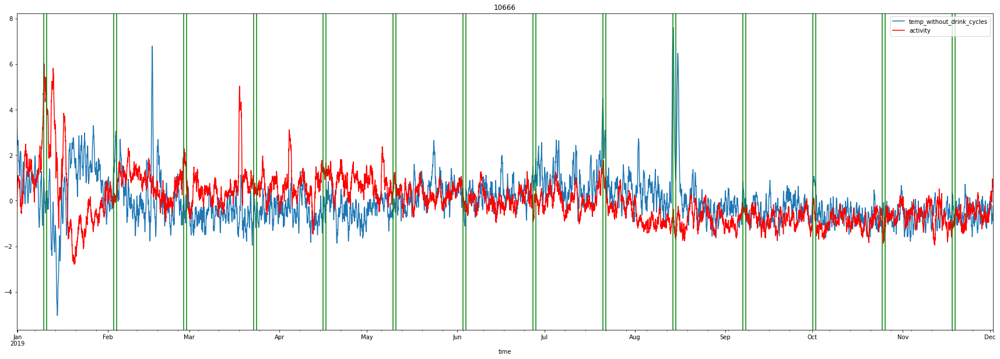

2018-09-11 00:00:00


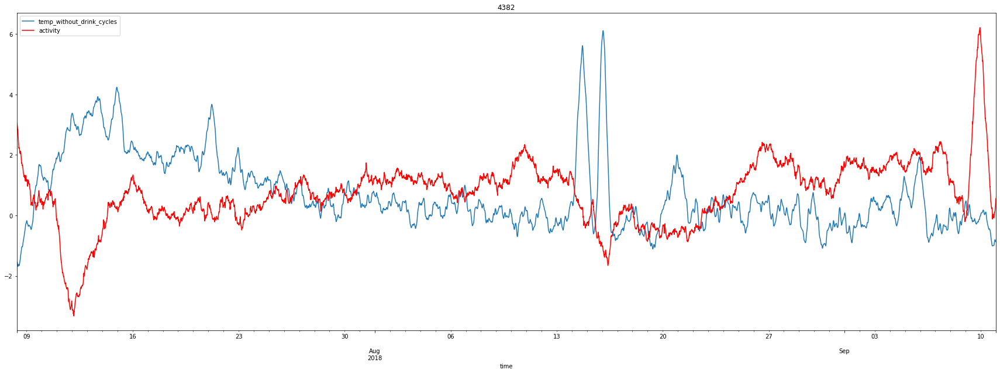

2018-09-11 00:00:00
24
2018-07-23T00:02:00.000000000
2018-08-16T00:02:00.000000000
2018-09-09T00:02:00.000000000


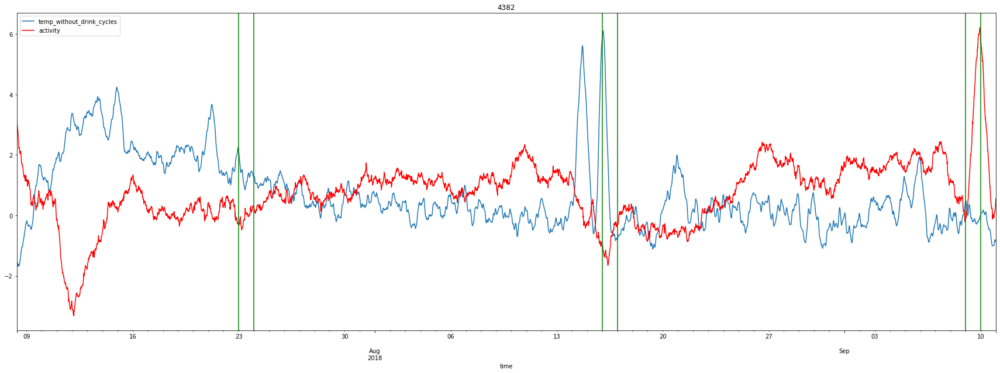

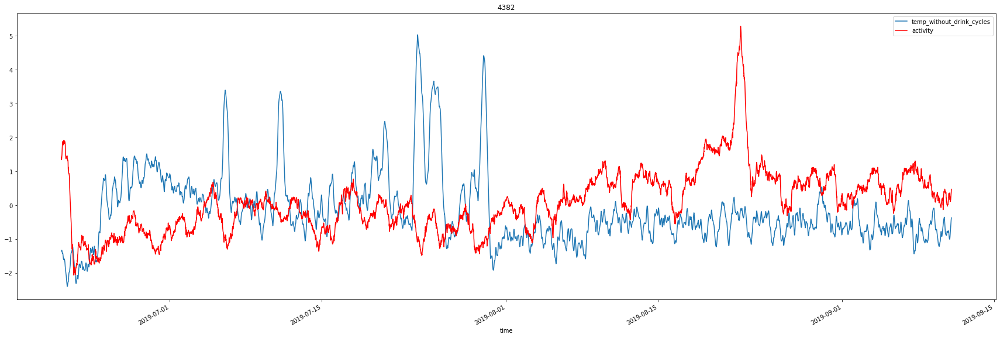

23
2019-07-06T00:02:00.000000000
2019-07-29T00:02:00.000000000
2019-08-21T00:02:00.000000000


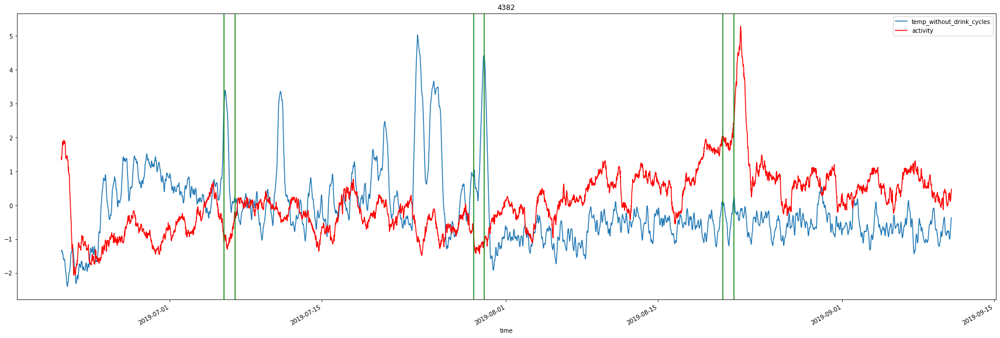

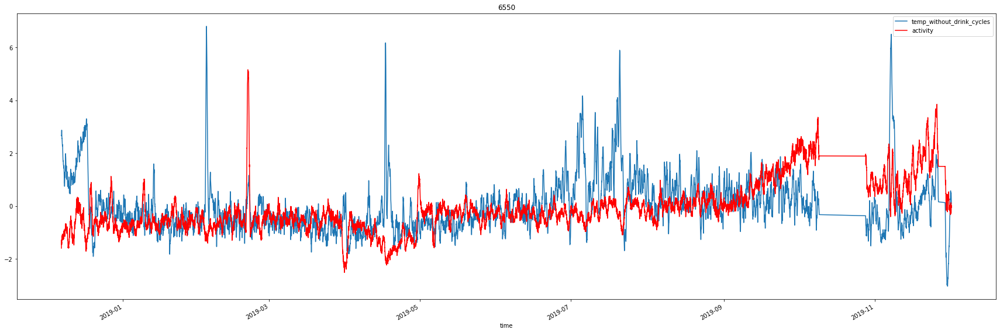

21
2018-12-12T00:04:00.000000000
2019-01-02T00:04:00.000000000
2019-01-23T00:04:00.000000000
2019-02-13T00:04:00.000000000
2019-03-06T00:04:00.000000000
2019-03-27T00:04:00.000000000
2019-04-17T00:04:00.000000000
2019-05-08T00:04:00.000000000
2019-05-29T00:04:00.000000000
2019-06-19T00:04:00.000000000
2019-07-10T00:04:00.000000000
2019-07-31T00:04:00.000000000
2019-08-21T00:04:00.000000000
2019-09-11T00:04:00.000000000
2019-10-02T00:04:00.000000000
2019-10-23T00:04:00.000000000
2019-11-13T00:04:00.000000000


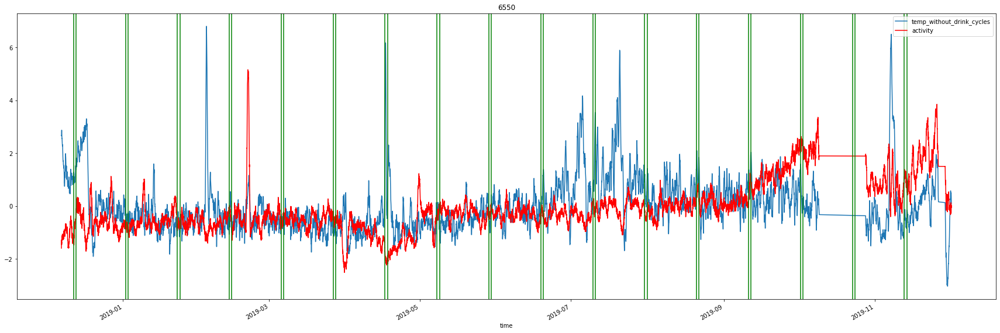

2018-11-26 00:00:00


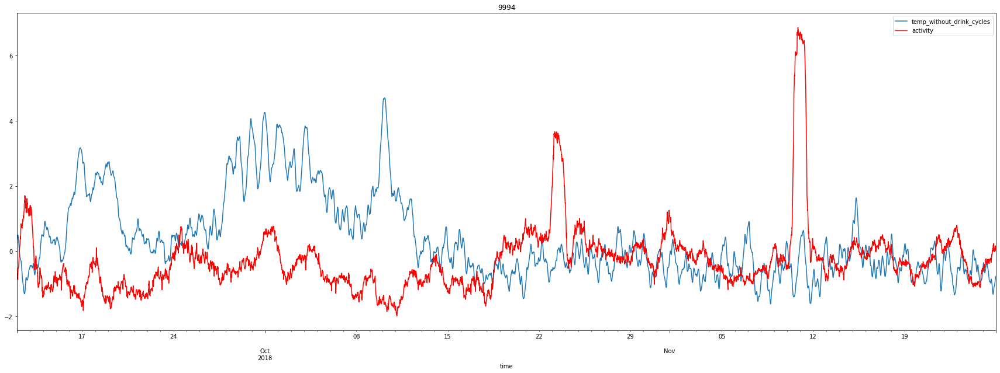

2018-11-26 00:00:00
23
2018-09-30T00:04:00.000000000
2018-10-23T00:04:00.000000000
2018-11-15T00:04:00.000000000


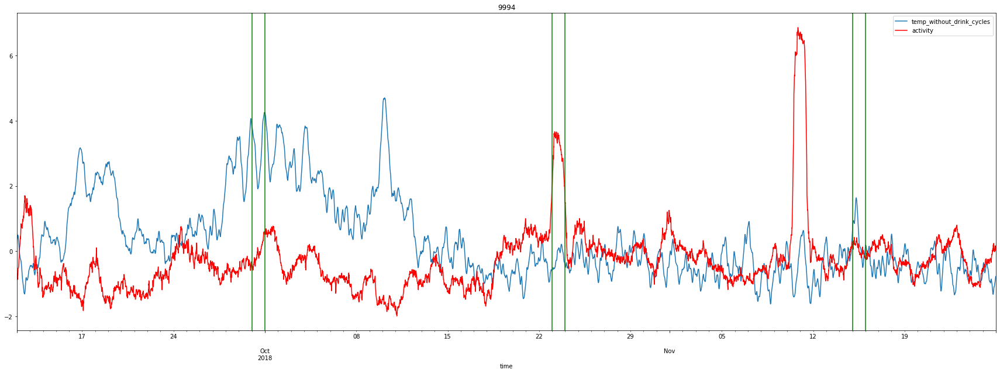

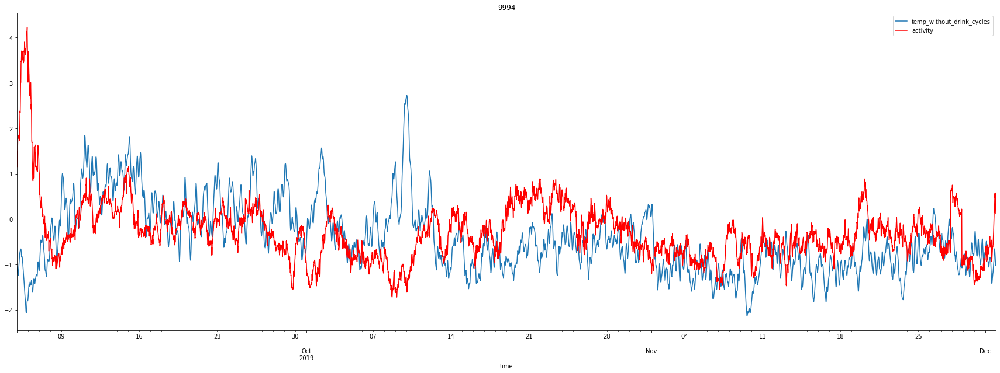

25
2019-09-20T00:04:00.000000000
2019-10-15T00:04:00.000000000
2019-11-09T00:04:00.000000000


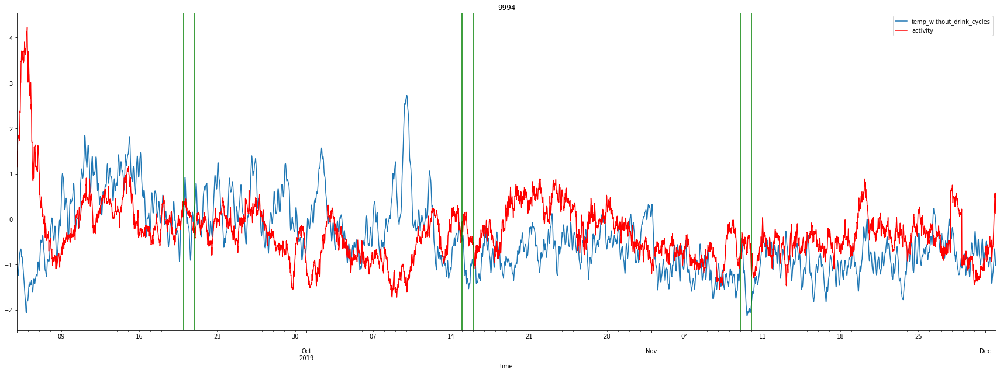

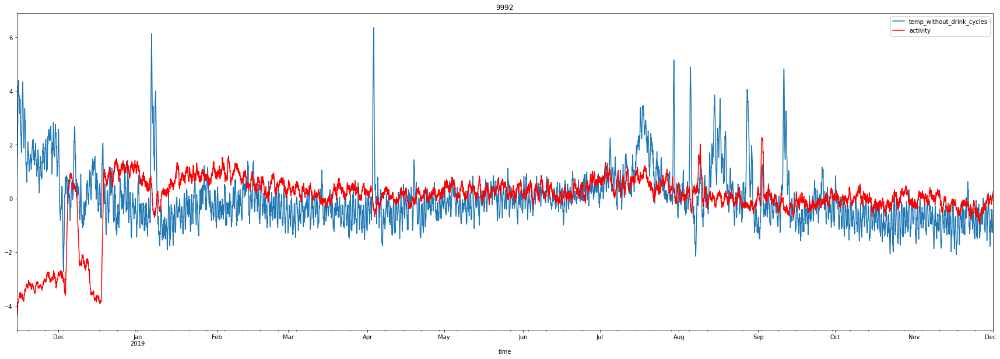

23
2018-11-16T00:08:00.000000000
2018-12-09T00:08:00.000000000
2019-01-01T00:08:00.000000000
2019-01-24T00:08:00.000000000
2019-02-16T00:08:00.000000000
2019-03-11T00:08:00.000000000
2019-04-03T00:08:00.000000000
2019-04-26T00:08:00.000000000
2019-05-19T00:08:00.000000000
2019-06-11T00:08:00.000000000
2019-07-04T00:08:00.000000000
2019-07-27T00:08:00.000000000
2019-08-19T00:08:00.000000000
2019-09-11T00:08:00.000000000
2019-10-04T00:08:00.000000000
2019-10-27T00:08:00.000000000
2019-11-19T00:08:00.000000000


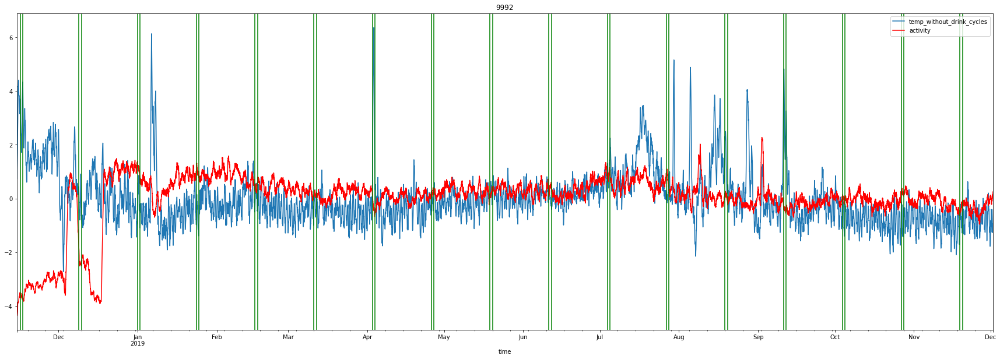

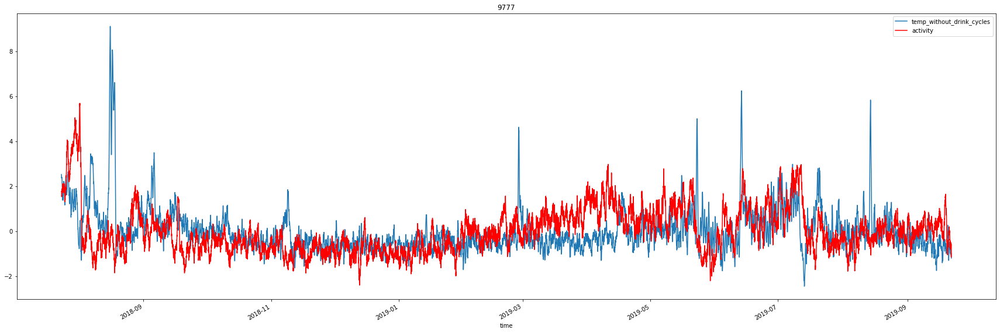

24
2018-07-26T00:07:00.000000000
2018-08-19T00:07:00.000000000
2018-09-12T00:07:00.000000000
2018-10-06T00:07:00.000000000
2018-10-30T00:07:00.000000000
2018-11-23T00:07:00.000000000
2018-12-17T00:07:00.000000000
2019-01-10T00:07:00.000000000
2019-02-03T00:07:00.000000000
2019-02-27T00:07:00.000000000
2019-03-23T00:07:00.000000000
2019-04-16T00:07:00.000000000
2019-05-10T00:07:00.000000000
2019-06-03T00:07:00.000000000
2019-06-27T00:07:00.000000000
2019-07-21T00:07:00.000000000
2019-08-14T00:07:00.000000000
2019-09-07T00:07:00.000000000


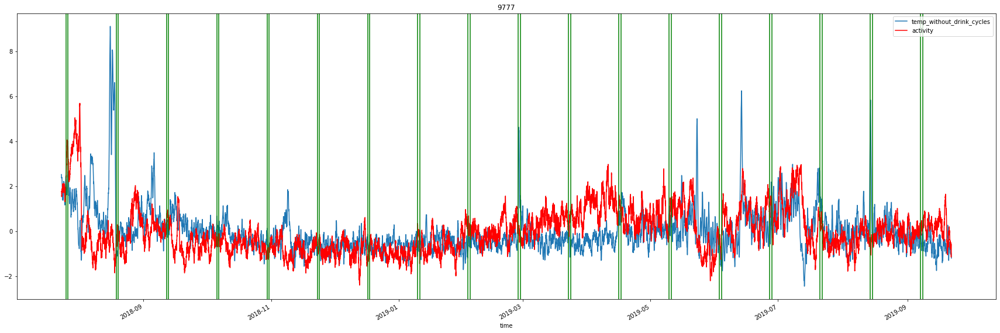

2018-10-28 00:00:00


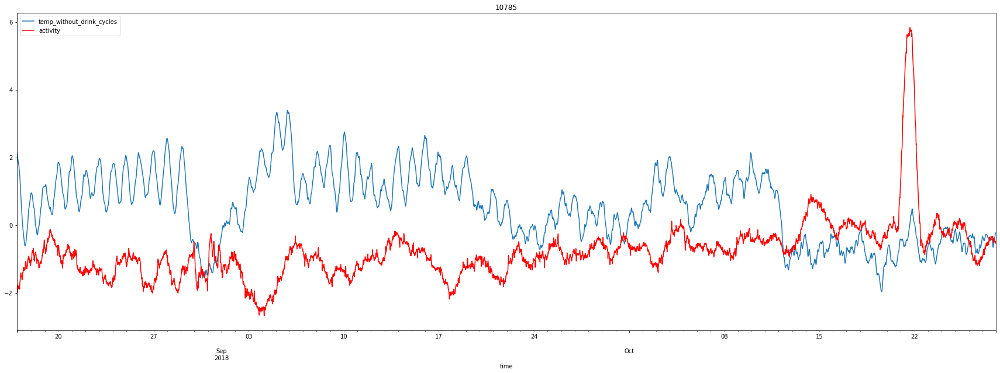

2018-10-28 00:00:00
23
2018-09-05T00:07:00.000000000
2018-09-28T00:07:00.000000000
2018-10-21T00:07:00.000000000


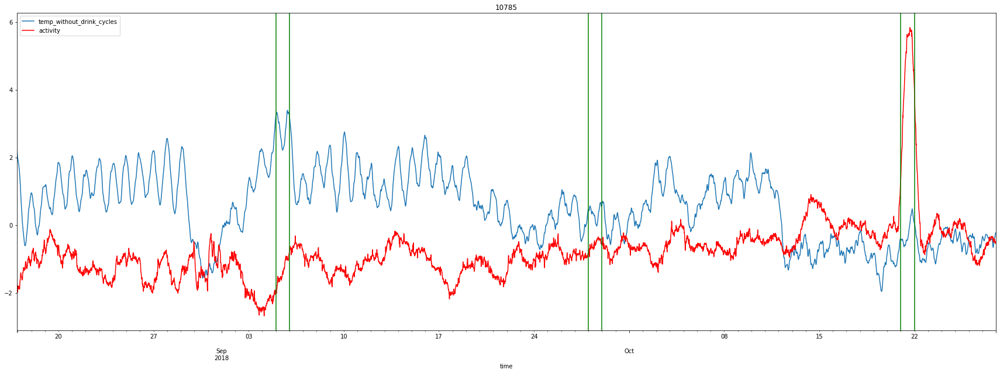

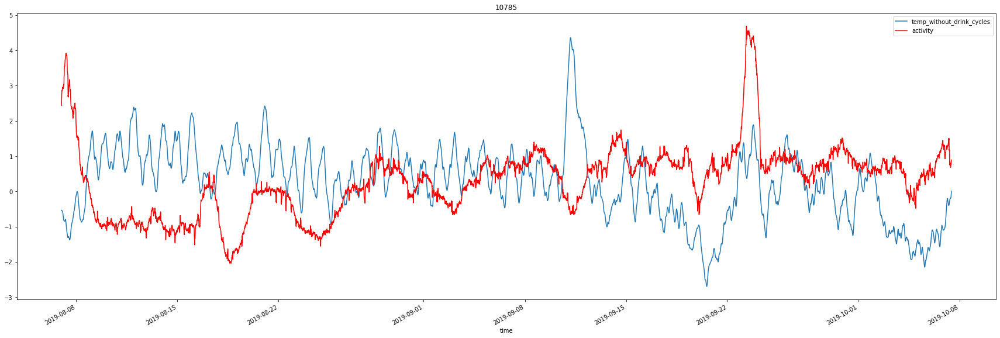

25
2019-08-21T00:07:00.000000000
2019-09-15T00:07:00.000000000


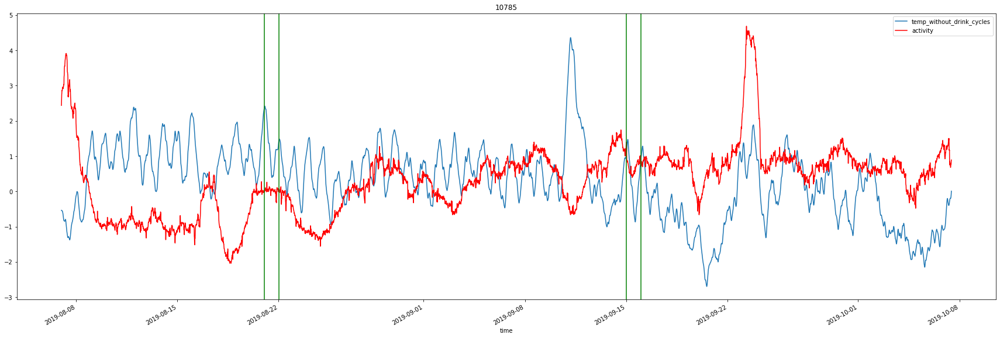

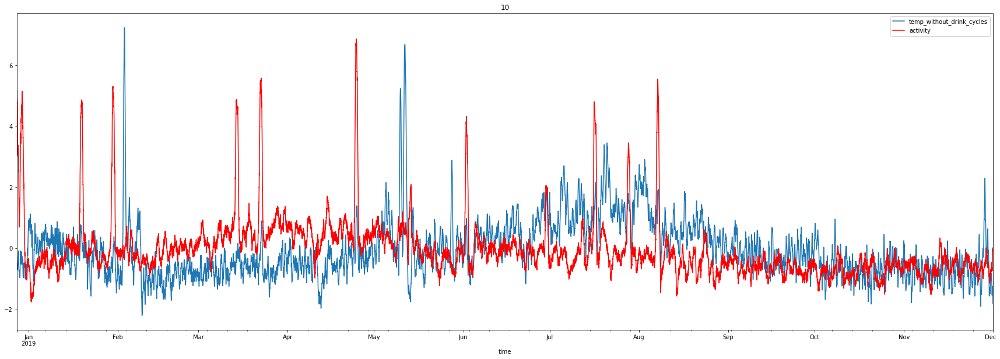

24
2019-01-10T00:06:00.000000000
2019-02-03T00:06:00.000000000
2019-02-27T00:06:00.000000000
2019-03-23T00:06:00.000000000
2019-04-16T00:06:00.000000000
2019-05-10T00:06:00.000000000
2019-06-03T00:06:00.000000000
2019-06-27T00:06:00.000000000
2019-07-21T00:06:00.000000000
2019-08-14T00:06:00.000000000
2019-09-07T00:06:00.000000000
2019-10-01T00:06:00.000000000
2019-10-25T00:06:00.000000000
2019-11-18T00:06:00.000000000


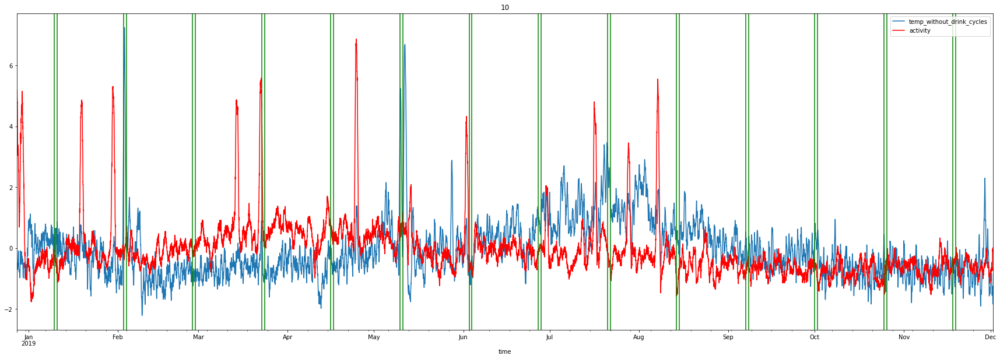

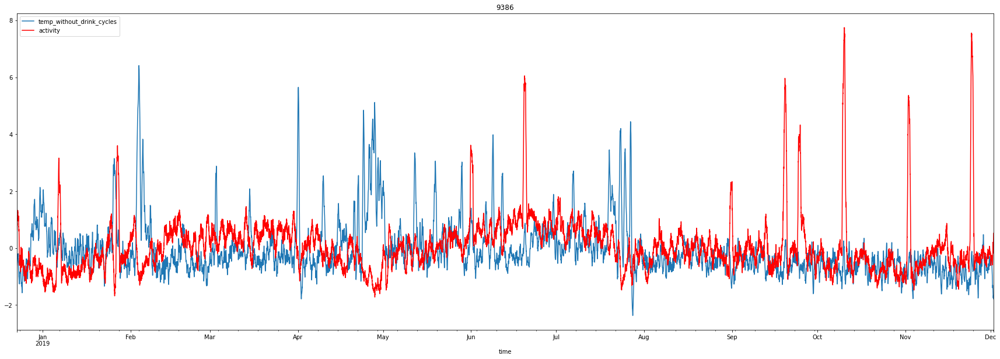

23
2018-12-30T00:01:00.000000000
2019-01-22T00:01:00.000000000
2019-02-14T00:01:00.000000000
2019-03-09T00:01:00.000000000
2019-04-01T00:01:00.000000000
2019-04-24T00:01:00.000000000
2019-05-17T00:01:00.000000000
2019-06-09T00:01:00.000000000
2019-07-02T00:01:00.000000000
2019-07-25T00:01:00.000000000
2019-08-17T00:01:00.000000000
2019-09-09T00:01:00.000000000
2019-10-02T00:01:00.000000000
2019-10-25T00:01:00.000000000
2019-11-17T00:01:00.000000000


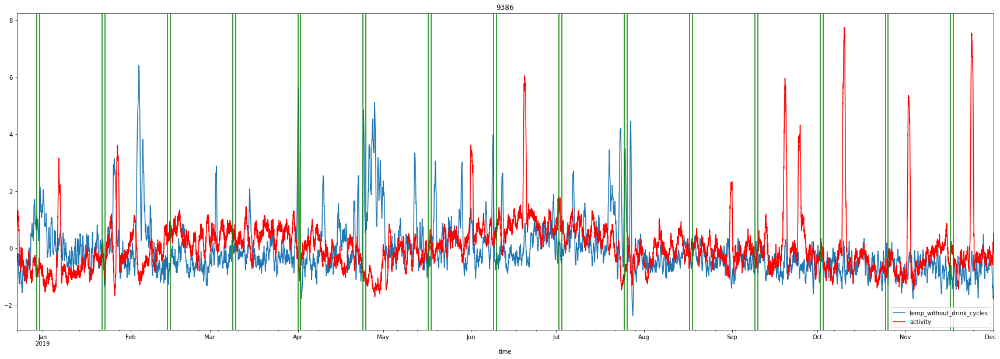

2018-09-27 00:00:00


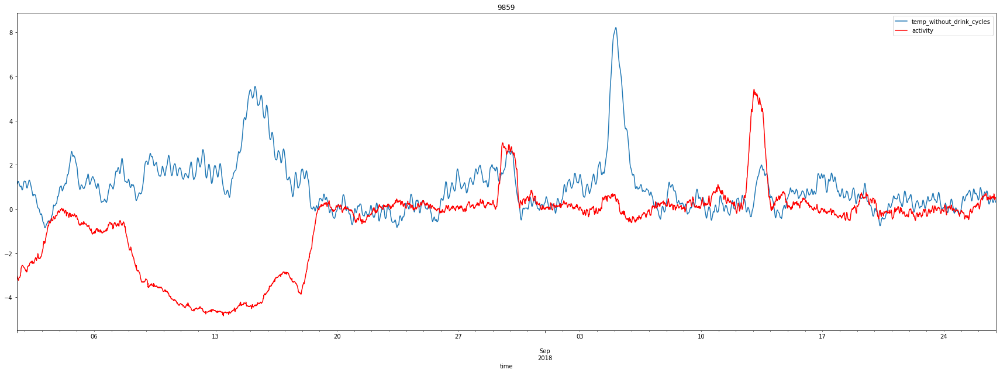

2018-09-27 00:00:00
24
2018-08-12T00:09:00.000000000
2018-09-05T00:09:00.000000000


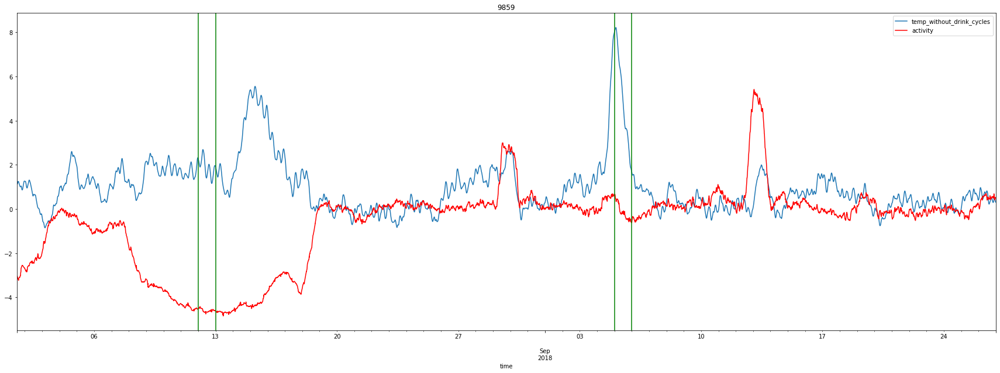

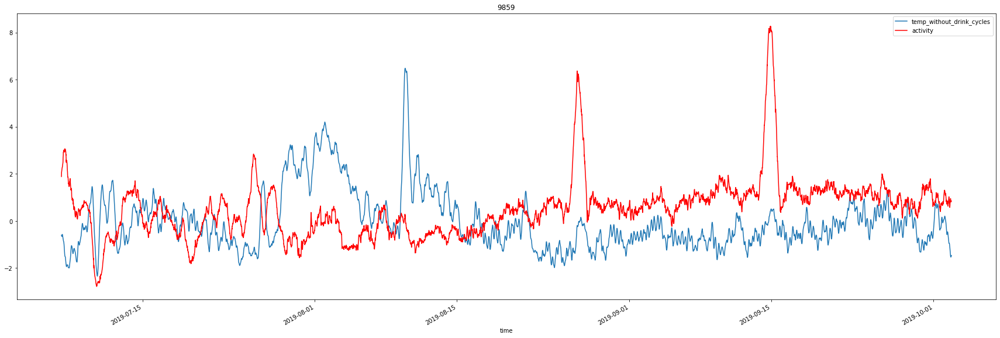

25
2019-07-26T00:09:00.000000000
2019-08-20T00:09:00.000000000
2019-09-14T00:09:00.000000000


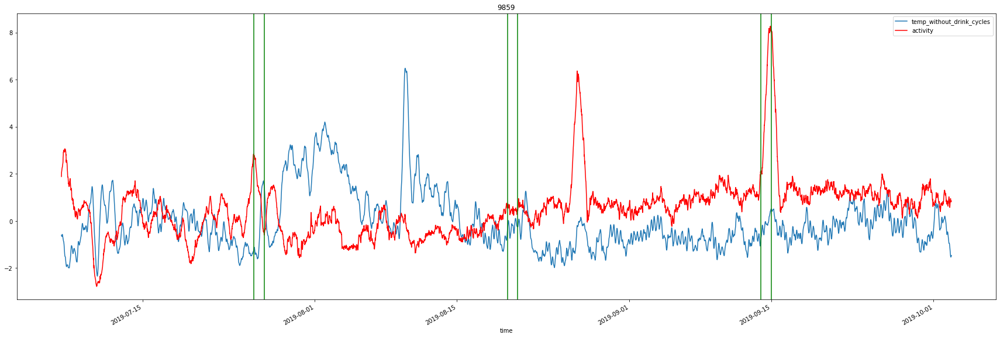

In [48]:
for cow in cows.keys():
    df = cows[cow]
    
    prev = df.time.iloc[0]
    for i, x in calves[calves.cow_id == cow].calving_date.iteritems():
        z = df[(df.time >= prev) & (df.time < x - pd.Timedelta(days=283))].reset_index()
        prev = x
        if len(z) > 0:
            heat = get_heats(z, cow)
            plot_cow(z, cow)
            plot_cow(z, cow, heat=heat)
    
    z = df[df.time >= prev].reset_index()
    heat = get_heats(z, cow)
    plot_cow(z, cow)
    plot_cow(z, cow, heat=heat)

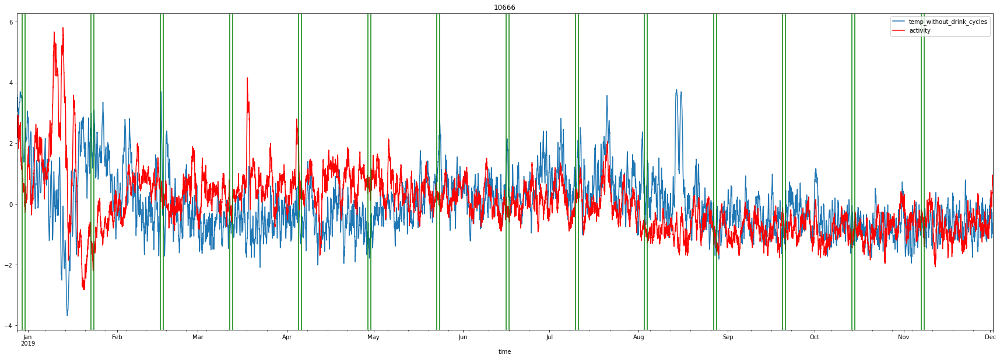

2018-09-11 00:00:00


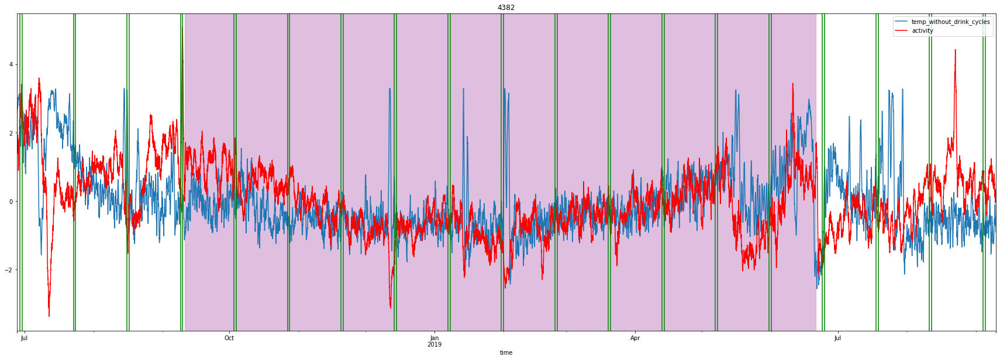

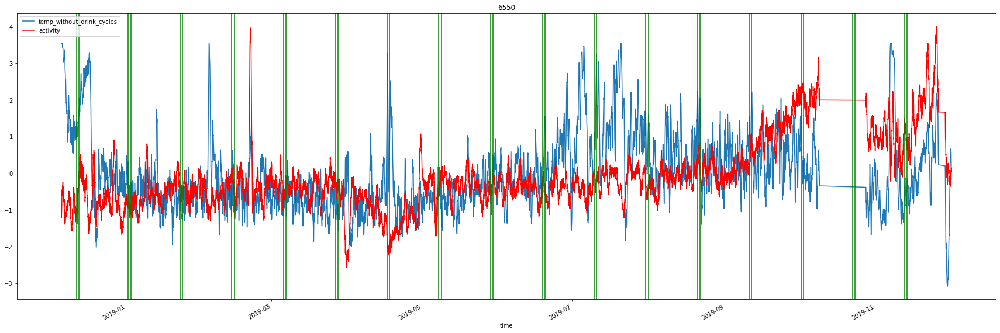

2017-12-03 00:00:00
2018-11-26 00:00:00


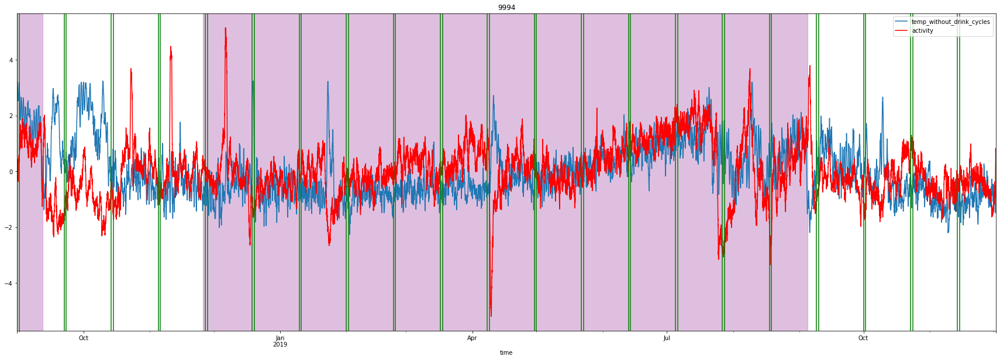

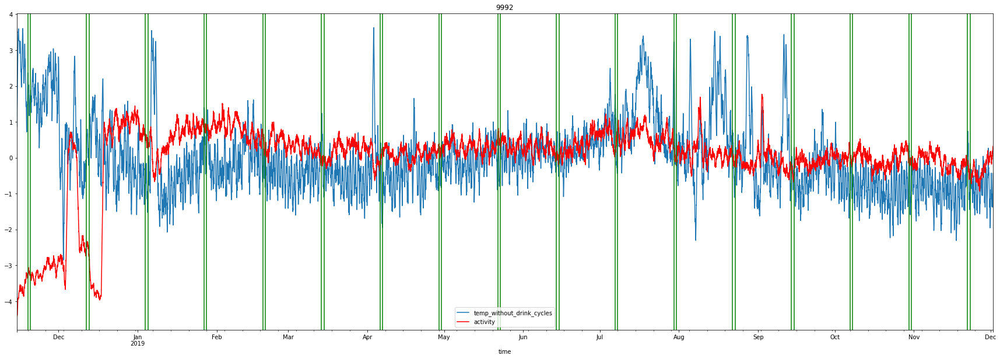

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:6: PeakPropertyWarning: some peaks have a prominence of 0
  


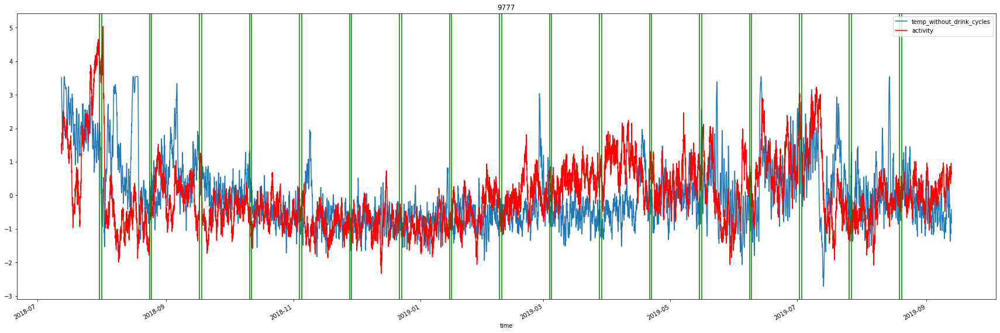

2018-10-28 00:00:00


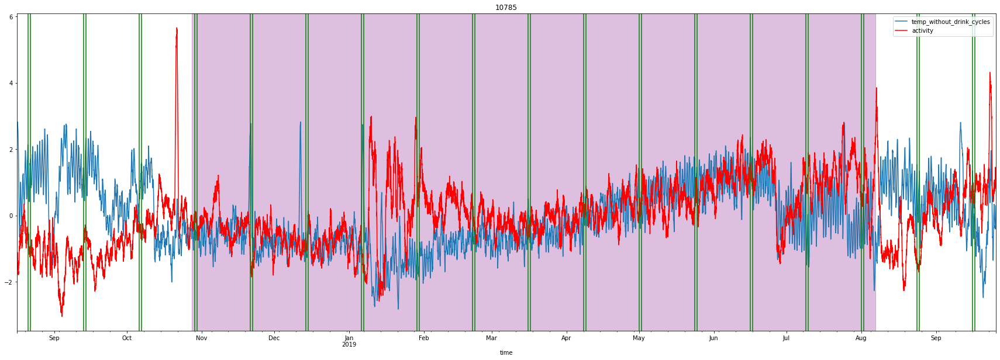

2018-03-20 00:00:00


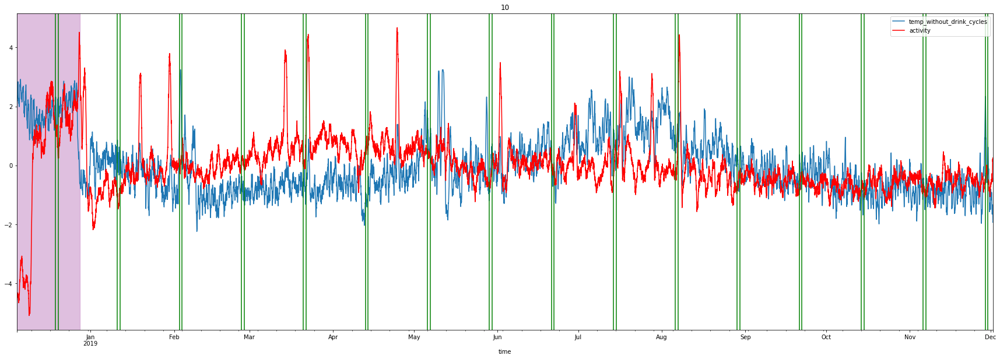

2018-03-15 00:00:00


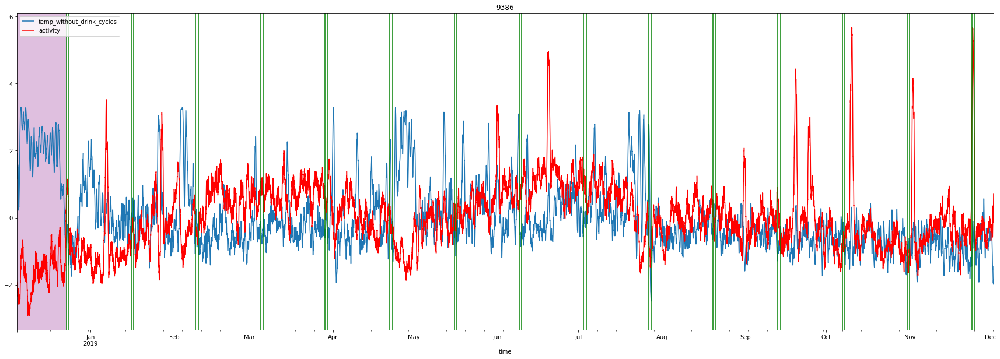

2018-09-27 00:00:00


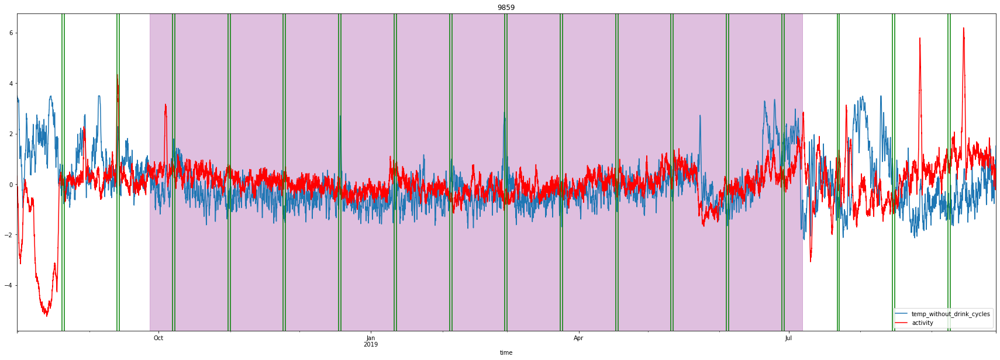

In [9]:
for cow in cows.keys():
    plot_heat(cows[cow], cow)

24
2019-07-05 00:02:00
2019-07-29 00:02:00
2019-08-22 00:02:00


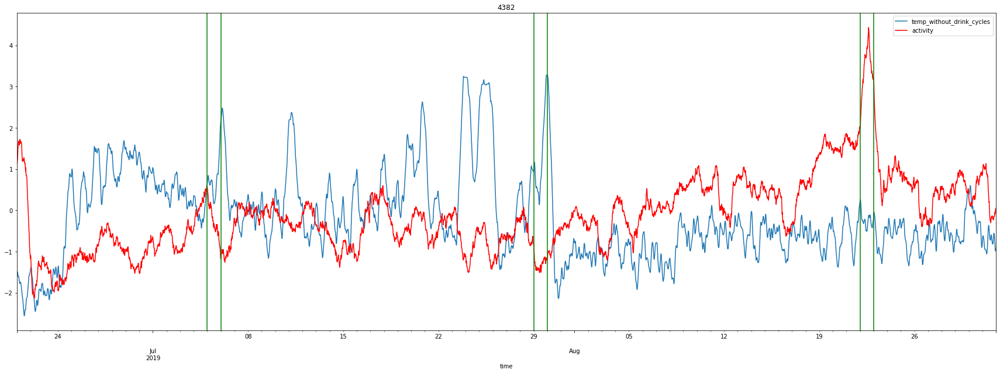

23
2018-12-23 00:04:00
2019-01-15 00:04:00
2019-02-07 00:04:00
2019-03-02 00:04:00
2019-03-25 00:04:00
2019-04-17 00:04:00
2019-05-10 00:04:00
2019-06-02 00:04:00
2019-06-25 00:04:00
2019-07-18 00:04:00
2019-08-10 00:04:00


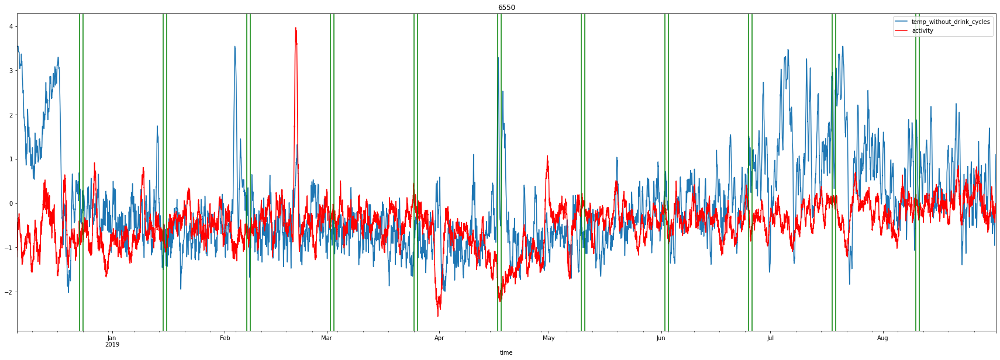

24
2019-01-14 00:01:00
2019-02-07 00:01:00
2019-03-03 00:01:00
2019-03-27 00:01:00
2019-04-20 00:01:00
2019-05-14 00:01:00
2019-06-07 00:01:00
2019-07-01 00:01:00
2019-07-25 00:01:00
2019-08-18 00:01:00


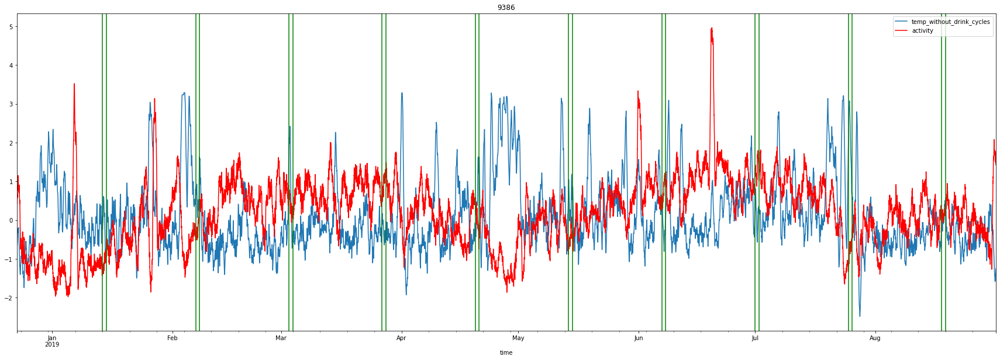

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:6: PeakPropertyWarning: some peaks have a prominence of 0
  


24
2018-07-31 00:07:00
2018-08-24 00:07:00
2018-09-17 00:07:00
2018-10-11 00:07:00
2018-11-04 00:07:00
2018-11-28 00:07:00
2018-12-22 00:07:00
2019-01-15 00:07:00
2019-02-08 00:07:00
2019-03-04 00:07:00
2019-03-28 00:07:00
2019-04-21 00:07:00
2019-05-15 00:07:00
2019-06-08 00:07:00
2019-07-02 00:07:00
2019-07-26 00:07:00
2019-08-19 00:07:00


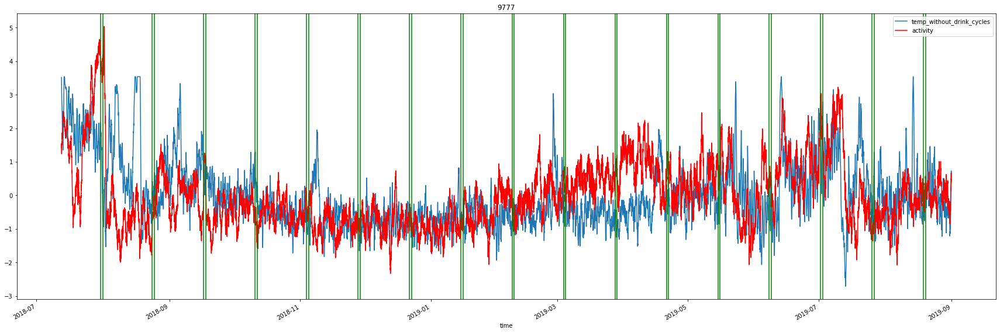

21
2019-07-26 00:09:00
2019-08-16 00:09:00


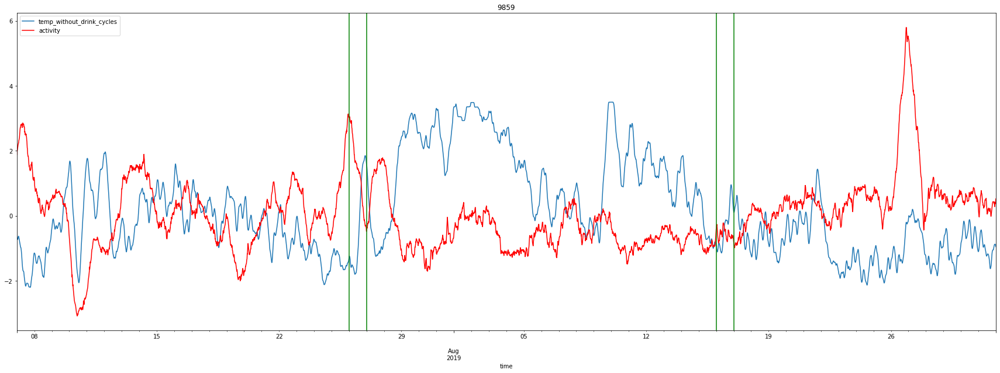

In [14]:
'''
4382: 2019-08-22, 24
6550: 2019-08-10, 23
9386: 2019-08-18, 24
9777: 2019-08-19, 24
9859: 2019-08-16, 21
'''


for cow in [4382, 6550, 9386, 9777, 9859]:
    df = cows[cow]
    if len(calves[calves.cow_id == cow]) == 0:
        df = df[df.time < pd.Timestamp('2019-09-01')].reset_index(drop=True)
    else:
        date = max(calves[calves.cow_id == cow].calving_date)
        df = df[(df.time > date) & (df.time < pd.Timestamp('2019-09-01'))].reset_index(drop=True)
    
    plot_heat(df, cow)